In [1]:
import geopandas as gpd
from shapely.geometry import Point, LineString
import networkx as nx
import matplotlib.pyplot as plt
from fuzzywuzzy import process

In [2]:
# === CONFIG ===
LINES_FILE = "/Users/jasperbosma/Desktop/data grachtenplanner/geojsons/Grachten2.geojson"
POINTS_FILE = "/Users/jasperbosma/Desktop/data grachtenplanner/geojsons/rondvaartopenafstapplekken.geojson"
OUTPUT_ROUTE_FILE = "shortest_route.geojson"
CRS_RDNEW = "EPSG:28992"
DEFAULT_SPEED_KMPH = 6

In [3]:
# gdf_lines.head()

NameError: name 'gdf_lines' is not defined

Enter names of points for the route (minimum 2).
Enter name of point 1: stationsplein
Did you mean:
- Steiger Statonsplein, centrum Amsterdam (83% match)
- Steiger Restaurant VakZuid en Olympisch Stadion Amsterdam (59% match)
- Palensteiger bij het Waterlooplein en Rembrandthuis (56% match)
- Breitnerstraat kleine stenen aanleg plek net naast de brug (56% match)
- Stenenkade Stadionkade (52% match)
Type the correct name from above (or 'retry' to try again): Steiger Statonsplein, centrum Amsterdam 
Enter name of point 2: Palensteiger bij het Waterlooplein en Rembrandthuis
Add more points? (y/n): n
✅ Route saved to: shortest_route.geojson
🛣 Total distance: 1.48 km
⏱ Estimated time: 14.8 minutes (based on speed_kmh)


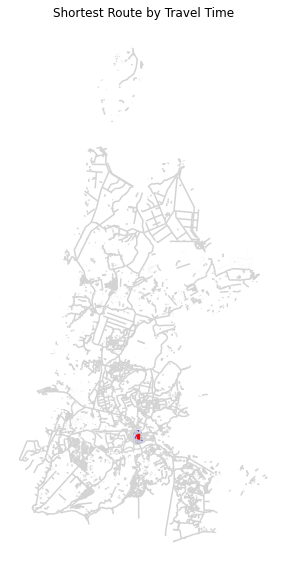

In [3]:
# === STEP 1: Load and Project GeoJSONs ===
gdf_lines = gpd.read_file(LINES_FILE)
gdf_points = gpd.read_file(POINTS_FILE)

# Filter valid geometry types
gdf_lines = gdf_lines[gdf_lines.geometry.type.isin(['LineString', 'MultiLineString'])]

# Reproject
gdf_lines = gdf_lines.to_crs(CRS_RDNEW)
gdf_points = gdf_points.to_crs(CRS_RDNEW)

# Check for required 'Name' column
assert 'Name' in gdf_points.columns, "The points file must contain a 'Name' column (capital N)."

# === STEP 2: Fuzzy Name Matching ===
def get_closest_name_input(prompt_text):
    while True:
        user_input = input(prompt_text).strip()
        matches = process.extract(user_input, gdf_points['Name'], limit=5)

        if matches[0][1] >= 90:
            return matches[0][0]
        else:
            print("Did you mean:")
            for m in matches:
                print(f"- {m[0]} ({m[1]}% match)")
            confirm = input("Type the correct name from above (or 'retry' to try again): ").strip()
            if confirm.lower() == 'retry':
                continue
            elif confirm in gdf_points['Name'].values:
                return confirm
            else:
                print("Invalid choice. Try again.")

# === STEP 3: Collect User Route Points ===
route_names = []

print("Enter names of points for the route (minimum 2).")
while True:
    name = get_closest_name_input(f"Enter name of point {len(route_names)+1}: ")
    route_names.append(name)

    if len(route_names) >= 2:
        more = input("Add more points? (y/n): ").strip().lower()
        if more != 'y':
            break

# === STEP 4: Build Network Graph with Travel Time ===
G = nx.Graph()

for idx, row in gdf_lines.iterrows():
    geom = row.geometry

    # Flatten to list of LineStrings
    if geom.type == 'MultiLineString':
        line_list = list(geom.geoms)
    elif geom.type == 'LineString':
        line_list = [geom]
    else:
        continue

    # Get speed
    speed_kmh = row.get('speed_kmh', DEFAULT_SPEED_KMPH)
    try:
        speed_kmh = float(speed_kmh)
        if speed_kmh <= 0:
            continue
    except:
        speed_kmh = DEFAULT_SPEED_KMPH

    for line in line_list:
        coords = list(line.coords)
        for i in range(len(coords) - 1):
            p1, p2 = coords[i], coords[i + 1]
            dist = Point(p1).distance(Point(p2))  # in meters
            travel_time_sec = dist / (speed_kmh * 1000 / 3600)
            G.add_edge(p1, p2, weight=travel_time_sec, distance=dist)

# === STEP 5: Snap Named Points to Graph ===
def snap_point_to_graph(point: Point, graph_nodes):
    return min(graph_nodes, key=lambda node: point.distance(Point(node)))

snapped_nodes = []
point_geoms = []

for name in route_names:
    pt = gdf_points[gdf_points['Name'] == name].geometry.iloc[0]
    point_geoms.append(pt)
    snapped = snap_point_to_graph(pt, G.nodes)
    snapped_nodes.append(snapped)

# === STEP 6: Compute Route ===
full_path_coords = []
total_dist_m = 0
total_time_sec = 0

for i in range(len(snapped_nodes) - 1):
    start = snapped_nodes[i]
    end = snapped_nodes[i + 1]
    try:
        segment = nx.shortest_path(G, source=start, target=end, weight='weight')

        segment_dist = 0
        segment_time = 0
        for j in range(len(segment) - 1):
            u, v = segment[j], segment[j + 1]
            edge_data = G.get_edge_data(u, v)
            segment_dist += edge_data.get("distance", 0)
            segment_time += edge_data.get("weight", 0)

        total_dist_m += segment_dist
        total_time_sec += segment_time

        if full_path_coords:
            segment = segment[1:]  # avoid repeating node
        full_path_coords.extend(segment)

    except nx.NetworkXNoPath:
        print(f"❌ No path between '{route_names[i]}' and '{route_names[i+1]}'.")
        
if full_path_coords:
    route_geom = LineString(full_path_coords)
    route_gdf = gpd.GeoDataFrame(geometry=[route_geom], crs=CRS_RDNEW)
    route_gdf.to_file(OUTPUT_ROUTE_FILE, driver="GeoJSON")
    print(f"✅ Route saved to: {OUTPUT_ROUTE_FILE}")

    total_km = total_dist_m / 1000
    travel_time_min = total_time_sec / 60

    print(f"🛣 Total distance: {total_km:.2f} km")
    print(f"⏱ Estimated time: {travel_time_min:.1f} minutes (based on speed_kmh)")

    # === Plot ===
    base = gdf_lines.plot(color="lightgray", figsize=(10, 10))
    gdf_points[gdf_points['Name'].isin(route_names)].plot(ax=base, color="blue", markersize=60)
    route_gdf.plot(ax=base, color="red", linewidth=3)
    plt.title("Shortest Route by Travel Time")
    plt.axis('off')
    plt.show()
else:
    print("❌ No valid route was generated.")




In [4]:

import plotly.graph_objects as go

# Convert GeoDataFrames to EPSG:4326 (WGS84) for Plotly
route_gdf_wgs = route_gdf.to_crs(epsg=4326)
gdf_points_wgs = gdf_points.to_crs(epsg=4326)
selected_points = gdf_points_wgs[gdf_points_wgs["Name"].isin(route_names)]

fig = go.Figure()

# Plot route line(s)
for line in route_gdf_wgs.geometry:
    if line.geom_type == "LineString":
        lon, lat = zip(*list(line.coords))  # unpack coordinates into lists
        fig.add_trace(go.Scattermapbox(
            lon=lon,
            lat=lat,
            mode="lines",
            line=dict(color="red", width=4),
            name="Route"
        ))

# Plot selected points with names
fig.add_trace(go.Scattermapbox(
    lon=selected_points.geometry.x.tolist(),
    lat=selected_points.geometry.y.tolist(),
    mode='markers+text',
    marker=dict(size=10, color='blue'),
    text=selected_points["Name"].tolist(),
    textposition="top center",
    name='Points'
))

# Map center
center_lon = selected_points.geometry.x.mean()
center_lat = selected_points.geometry.y.mean()

# Layout and display
fig.update_layout(
    mapbox=dict(
        style="open-street-map",
        center={"lon": center_lon, "lat": center_lat},
        zoom=12
    ),
    margin={"r": 0, "t": 30, "l": 0, "b": 0},
    height=700,
    title="📍 Shortest Route by Travel Time (Interactive Map)"
)

fig.show()


In [5]:
import geopandas as gpd
import plotly.graph_objects as go

# # === CONFIG ===
# LINES_FILE = "lines.geojson"
# POINTS_FILE = "points.geojson"
# CRS_RDNEW = "EPSG:28992"

# # === Load and project data ===
# gdf_lines = gpd.read_file(LINES_FILE)
# gdf_points = gpd.read_file(POINTS_FILE)

# Ensure only LineString or MultiLineString geometries
gdf_lines = gdf_lines[gdf_lines.geometry.type.isin(["LineString", "MultiLineString"])]

# Project to WGS84 for Plotly
gdf_lines = gdf_lines.to_crs(epsg=4326)
gdf_points = gdf_points.to_crs(epsg=4326)

# === Separate one-way and two-way lines ===
gdf_oneway = gdf_lines[gdf_lines["oneway"].str.lower() == "yes"]
gdf_twoway = gdf_lines[gdf_lines["oneway"].str.lower() != "yes"]

# === Initialize Plotly Figure ===
fig = go.Figure()

# === Plot two-way lines ===
for line in gdf_twoway.geometry:
    if line.geom_type == "MultiLineString":
        for subline in line.geoms:
            lon, lat = zip(*list(subline.coords))
            fig.add_trace(go.Scattermapbox(
                lon=lon, lat=lat,
                mode="lines",
                line=dict(color="lightblue", width=2),
                name="Two-way",
                showlegend=False
            ))
    elif line.geom_type == "LineString":
        lon, lat = zip(*list(line.coords))
        fig.add_trace(go.Scattermapbox(
            lon=lon, lat=lat,
            mode="lines",
            line=dict(color="lightblue", width=2),
            name="Two-way",
            showlegend=False
        ))

# === Plot one-way lines ===
for line in gdf_oneway.geometry:
    if line.geom_type == "MultiLineString":
        for subline in line.geoms:
            lon, lat = zip(*list(subline.coords))
            fig.add_trace(go.Scattermapbox(
                lon=lon, lat=lat,
                mode="lines",
                line=dict(color="red", width=2),
                name="One-way",
                showlegend=False
            ))
    elif line.geom_type == "LineString":
        lon, lat = zip(*list(line.coords))
        fig.add_trace(go.Scattermapbox(
            lon=lon, lat=lat,
            mode="lines",
            line=dict(color="red", width=2),
            name="One-way",
            showlegend=False
        ))

# === Plot Points ===
fig.add_trace(go.Scattermapbox(
    lon=gdf_points.geometry.x.tolist(),
    lat=gdf_points.geometry.y.tolist(),
    mode='markers',
    marker=dict(size=9, color='blue'),
    text=gdf_points["Name"],  # hover text
    hoverinfo='text',
    name='Points'
))

# === Set Center and Layout ===
center_lon = gdf_points.geometry.x.mean()
center_lat = gdf_points.geometry.y.mean()

fig.update_layout(
    mapbox=dict(
        style="open-street-map",
        center={"lat": center_lat, "lon": center_lon},
        zoom=12
    ),
    height=750,
    margin=dict(l=0, r=0, t=30, b=0),
    title="🗺 Network Map with One-way and Two-way Routes",
    showlegend=False
)

fig.show()
